# Taming Transformers

This notebook is a minimal working example to generate landscape images as in [Taming Transformers for High-Resolution Image Synthesis](https://github.com/CompVis/taming-transformers). **tl;dr** We combine the efficiancy of convolutional approaches with the expressivity of transformers by introducing a convolutional VQGAN, which learns a codebook of context-rich visual parts, whose composition is modeled with an autoregressive transformer.

Next, we install minimal required dependencies.

## Loading the model

We load and print the config.

In [1]:
import argparse, os, sys, datetime, glob, importlib
from omegaconf import OmegaConf
import numpy as np
from PIL import Image
import torch
import torchvision
from torch.utils.data import random_split, DataLoader, Dataset
import torch.nn.functional as F
from torch.utils.data import DataLoader
import os

from taming_comb.modules.style_encoder.network import *
from taming_comb.modules.diffusionmodules.model import * 

from taming_comb.models.cond_transformer import * 

import argparse

def get_obj_from_str(string, reload=False):
    module, cls = string.rsplit(".", 1)
    if reload:
        module_imp = importlib.import_module(module)
        importlib.reload(module_imp)
    return getattr(importlib.import_module(module, package=None), cls)


def instantiate_from_config(config):
    if not "target" in config:
        raise KeyError("Expected key `target` to instantiate.")
    return get_obj_from_str(config["target"])(**config.get("params", dict()))

os.environ["CUDA_VISIBLE_DEVICES"]= '7'


device = torch.device('cuda' if torch.cuda.is_available() else "cpu")
print('device: ', device)
ne = 512  # Enlarge
ed = 512

dataset = 'summer2winter'

torch.cuda.empty_cache()

# first_model_save_path = '{}_{}_{}_settingc_{}'.format(dataset, ed, ne, 256)    # first stage model dir
# save_path = dataset + '{}_{}_{}_transformer'.format(dataset, ed, ne)    # second stage model dir
root = '/eva_data_2/vqi2i/datasets/' + dataset + '_yosemite/'
# root = '/home/jenny870207/data/' + dataset + '/'

# load second stage model
# f = os.path.join(os.getcwd(), save_path, 'n_900.pt')
f = os.path.join(os.getcwd(), 'n_900.pt')

transformer_config = OmegaConf.load('transformer.yaml')
transformer_config.model.params.f_path = os.path.join(os.getcwd(), 'settingc_latest.pt')
transformer_config.model.params.device = str(device)
model = instantiate_from_config(transformer_config.model)


if(os.path.isfile(f)):
    print('load ' + f)
    ck = torch.load(f, map_location=device)
    model.load_state_dict(ck['model_state_dict'], strict=False)
model = model.to(device)
model.eval()

print('Finish Loading!')

device:  cuda
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
load /home/jenny/vqgan-transformer/settingc_latest.pt
load /home/jenny/vqgan-transformer/n_900.pt
Finish Loading!


Instantiate the model.

Load the checkpoint.

## Load example data

Load an example segmentation and visualize.

Visualize

Our model also employs a VQGAN for the conditioning information, i.e. the segmentation in this example. Let's autoencode the segmentation map. Encoding returns both the quantized code and its representation in terms of indices of a learned codebook.

Let's sample indices corresponding to codes from the image VQGAN given the segmentation code. We init randomly and take a look.

In [2]:
def show_image(s):
    s = s.detach().cpu().numpy().transpose(0,2,3,1)[0]
    s = ((s+1.0)*127.5).clip(0,255).astype(np.uint8)
    s = Image.fromarray(s)
    display(s)

In [76]:
import os
import torch.utils.data as data
from PIL import Image
from torchvision.transforms import Compose, Resize, RandomCrop, CenterCrop, RandomHorizontalFlip, ToTensor, Normalize
import random
import torch
import numpy as np

class dataset_single(data.Dataset):
    def __init__(self, root, mode, _class, model, resize=256, cropsize=256, flip=True):
        self.root = root
        
        # style information
        self.vqi2i = model
        self.label = 1 if _class == 'A' else 0
        
        images = os.listdir(os.path.join(self.root, mode + _class))
        self.img_path = [os.path.join(self.root, mode + _class, x) for x in images]
        self.size = len(self.img_path)
        self.input_dim = 3

        ## resize size
        transforms = [Resize((resize, resize), Image.BICUBIC)]
        if(mode == 'train'):
            transforms.append(RandomCrop(cropsize))
        else:
            transforms.append(CenterCrop(cropsize))

        ## flip
        if(flip):
            transforms.append(RandomHorizontalFlip())

        transforms.append(ToTensor())
        transforms.append(Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]))
        self.transforms = Compose(transforms)
        return

    def __getitem__(self, index):
        print('Index: {}'.format(index))
        return self.load_img(self.img_path[index], self.input_dim)
        
    def __len__(self):
        return self.dataset_size

    def load_img(self, img_name, input_dim):
        img = Image.open(img_name).convert('RGB')
        img = self.transforms(img)
        if(input_dim == 1):
            img = img[0, ...] * 0.299 + img[1, ...] * 0.587 + img[2, ...] * 0.114
            img = img.unsqueeze(0)
        img = img.unsqueeze(0) # make tensor2im workable
        
        style = self.vqi2i.encode_style( img.to(device), self.label)
        print('Image Path: {}'.format(img_name))
        return {'img_name': img_name.split('/')[-1], 'image': img.to(device), 'style': style, 'label': self.label}

## Sample an image

We use the transformer in a sliding window manner to sample all code entries sequentially. The code below assumes a window size of $16\times 16$.

In [4]:
import matplotlib.pyplot as plt
def tensor2im(input_image, imtype=np.uint8):
    """"Converts a Tensor array into a numpy image array.

    Parameters:
        input_image (tensor) --  the input image tensor array
        imtype (type)        --  the desired type of the converted numpy array
    """
    if not isinstance(input_image, np.ndarray):
        if isinstance(input_image, torch.Tensor):  # get the data from a variable
            image_tensor = input_image.data
        else:
            return input_image
        image_numpy = image_tensor[0].clamp(-1.0, 1.0).cpu().float().numpy()  # convert it into a numpy array
        if image_numpy.shape[0] == 1:  # grayscale to RGB
            image_numpy = np.tile(image_numpy, (3, 1, 1))
        image_numpy = (np.transpose(image_numpy, (1, 2, 0)) + 1) / 2.0 * 255.0  # post-processing: tranpose and scaling
    else:  # if it is a numpy array, do nothing
        image_numpy = input_image
    return image_numpy.astype(imtype)

In [5]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [6]:

def sythesize(idx, style, label, z_code_shape, temperature=2.0, top_k=150, return_idx=False):
    start_t = time.time()
    print(z_code_shape)
    for i in range(0, z_code_shape[2]-0):
      if i <= window_size//2:
        local_i = i
      elif (z_code_shape[2]-i) < window_size//2:
        local_i = window_size -(z_code_shape[2]-i)
      else:
        local_i = window_size//2
      for j in range(0,z_code_shape[3]-0):

        if j <= window_size//2:
          local_j = j
        elif (z_code_shape[3]-j) < window_size//2:
          local_j = window_size - (z_code_shape[3]-j)
        else:
          local_j = window_size//2

        i_start = i-local_i
        i_end = i_start+int(window_size)
        j_start = j-local_j
        j_end = j_start+int(window_size)
        
        if(i >= original_size or j >= original_size):

            patch = idx[:,i_start:i_end,j_start:j_end]
            patch = patch.reshape(patch.shape[0],-1)
            cpatch = cidx[:, i_start:i_end, j_start:j_end]
            cpatch = cpatch.reshape(cpatch.shape[0], -1)

            patch = torch.cat((cpatch, patch), dim=1)
            logits,_ = model.transformer(patch[:,:-1]) # [1, x, 512]
            logits = logits[:, -window_size*window_size:, :] # [1, 256, 512]
            logits = logits.reshape(z_code_shape[0],window_size,window_size,-1)  # [1, 16, 16, 512]
            logits = logits[:,local_i,local_j,:] # [1, 512]   

            logits = logits/temperature # small not equal

            if top_k is not None:
              logits = model.top_k_logits(logits, top_k)

            probs = torch.nn.functional.softmax(logits, dim=-1)
            idx[:,i,j] = torch.multinomial(probs, num_samples=1)
      
#         print(f"Step: ({i},{j}) | Local: ({local_i},{local_j}) | Crop: ({i_start}:{i_end},{j_start}:{j_end})")
#         x_sample = model.decode_to_img(idx, (1, codebook_size, h, w), style, label)
#         show_image(x_sample)
    
    print(f"Time: {time.time() - start_t} seconds")
    if(return_idx):
        return idx

    x_sample = model.decode_to_img(idx, (1, codebook_size, h, w), style, label)
    print(f"Step: ({i},{j}) | Local: ({local_i},{local_j}) | Crop: ({i_start}:{i_end},{j_start}:{j_end})")
    
    return x_sample


In [209]:
from IPython.display import clear_output
import time
import random

original_size = 16
# size = 20
h, w = 20, 28
codebook_size = 512
window_size = 16

Index: 267
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testA/2013-08-27 12:17:11.jpg


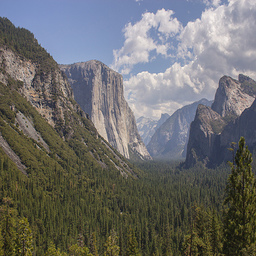

Index: 307
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testA/2016-07-24 23:14:50.jpg


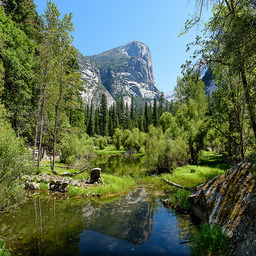

Index: 258
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testA/2015-05-27 05:15:41.jpg


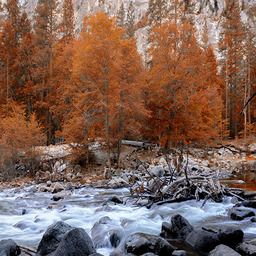

In [210]:
img_list = [] # each element is a dictionary

# pick 3 images from both A and B set
style_num = 3

testA_set = dataset_single(root, 'test', 'A', model.first_stage_model, flip=False)

A_list = [51, 2, 59, 238, 32, 110, 136, 142, 22, 265, 234, 75, 248, 202, 300, 216, 290, 122, 293, 
          94, 251, 217, 194, 136, 196, 267, 307, 258]
for i in A_list[-3:]:
# for i in range(style_num):
#     img = testA_set[random.randint(0, testA_set.size-1)]
    img = testA_set[i]
    show_image(img['image'])
    img_list.append(img)

Index: 181
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testB/2017-01-04 16:32:01.jpg


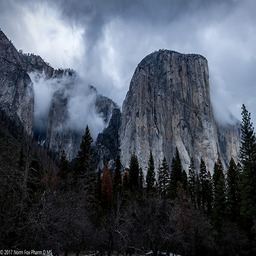

Index: 143
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testB/2010-10-17 22:30:20.jpg


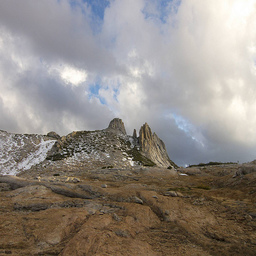

Index: 97
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testB/2015-12-14 19:22:50.jpg


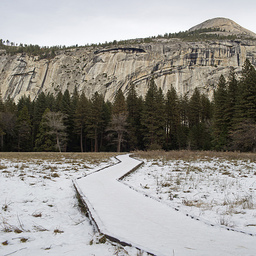

In [211]:
testB_set = dataset_single(root, 'test', 'B', model.first_stage_model, flip=False)

B_list = [ 54, 9, 201, 22, 55, 192, 52, 210, 233, 212, 227, 149, 1, 10, 147,  181, 143, 97]
for i in B_list[-3:]:
# for i in range(style_num):
#     img = testB_set[random.randint(0, testB_set.size-1)]
    img = testB_set[i]
    show_image(img['image'])
    img_list.append(img)    

In [212]:
len(img_list)

6

In [190]:
A_content = img_list[0]

# get content z_code
z_code, z_indices, _ = model.encode_to_z(A_content['image'], A_content['label']) # [1, 256]
print(z_code.shape)
z_code_shape = (1, codebook_size,  h, w)
z_indices_shape = z_indices.shape

torch.Size([1, 512, 16, 16])


Reconstruction


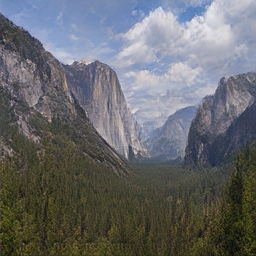

tensor(0.1269, device='cuda:0')
---------------------------------


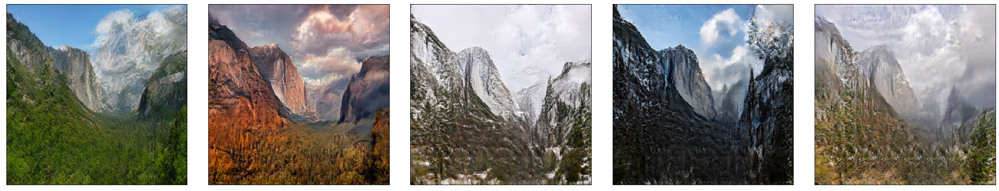

In [191]:
print('Reconstruction')
x_sample = model.decode_to_img(
    z_indices.reshape(z_code_shape[0], original_size, original_size), 
    (z_code_shape[0], codebook_size, original_size, original_size),  A_content['style'],  A_content['label'])
show_image(x_sample)
print(nn.L1Loss()(A_content['image'], x_sample))
print('---------------------------------')

new_style_imgs = []
f = plt.figure(figsize=(24, 10))
for i in range(1, len(img_list)):
    x_sample = model.decode_to_img(
        z_indices.reshape(z_code_shape[0], original_size, original_size), 
        (z_code_shape[0], codebook_size, original_size, original_size), img_list[i]['style'], img_list[i]['label'])
    ax = f.add_subplot(1, len(img_list)-1, i)
    fig = plt.imshow(tensor2im(x_sample))
    plt.tight_layout()
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)

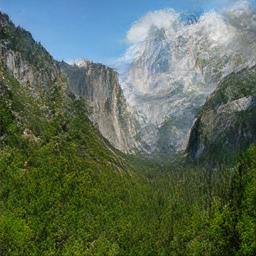

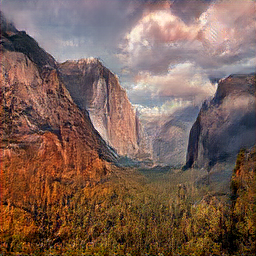

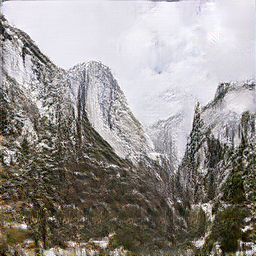

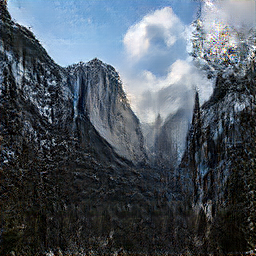

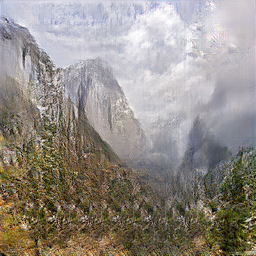

In [192]:

for i in range(1, len(img_list)):
    x_sample = model.decode_to_img(
        z_indices.reshape(z_code_shape[0], original_size, original_size), 
        (z_code_shape[0], codebook_size, original_size, original_size), img_list[i]['style'], img_list[i]['label'])
    show_image(x_sample)

(1, 512, 20, 28)
Time: 7.692113161087036 seconds


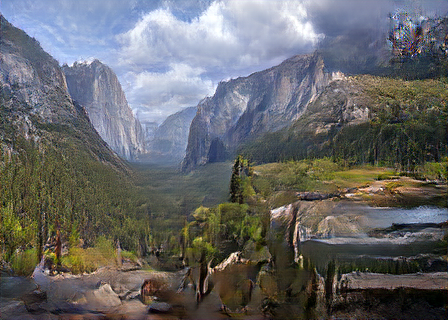

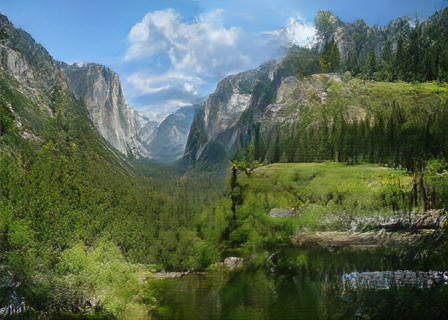

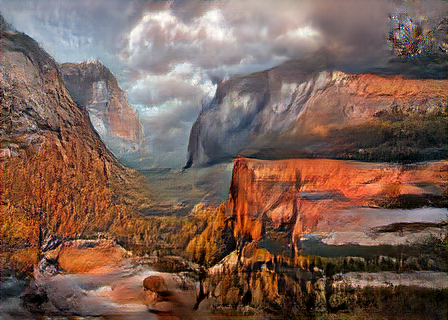

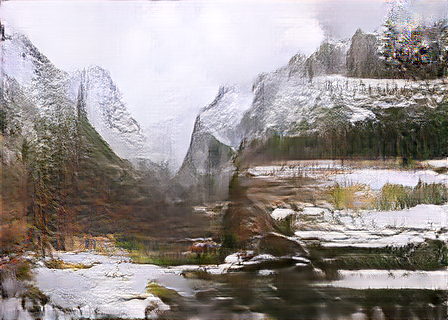

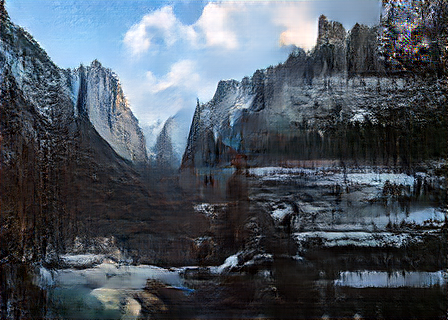

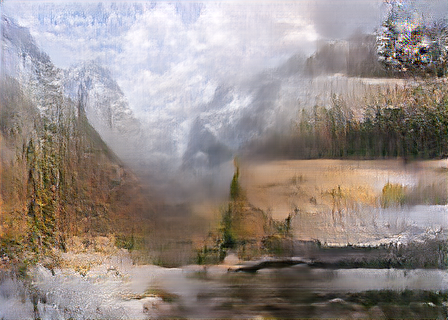

torch.Size([1, 3, 320, 448])


In [196]:
z_random = torch.randint(codebook_size, (w*h,)).to(device) # [400]
z_random = z_random.reshape(z_code_shape[0], h, w) # [1, 20, 20]

# set left-top part as the input image
z_random[:, :original_size, :original_size] = z_indices.reshape(z_code_shape[0], original_size, original_size)

## idx as the input (original + random)
idx = z_random.detach().clone() # [1, 20, 20]

# coordinate encode as condition
c_size = 256 # original image size
coordinate = np.arange(c_size*c_size).reshape(c_size,c_size,1)/(c_size*c_size)
coordinate = torch.from_numpy(coordinate) # [256, 256, 1]
c = model.get_c(coordinate) # [1, 1, 256, 256]
c = c.to(device)

# encode with condition
_, cidx = model.encode_to_c(c) # [1, 256]
cidx = cidx.reshape(z_code_shape[0], 16, 16) # [1, 16, 16]

gen_idx = sythesize(idx, _, label=A_content['label'], z_code_shape=z_code_shape, return_idx=True, temperature=1.1, top_k=80)

for img in img_list:
    gen_img = model.decode_to_img(gen_idx, (1, codebook_size, h, w), img['style'], img['label'])
    show_image(gen_img)
print(gen_img.shape)

In [200]:
print(gen_idx)
torch.save(gen_idx, 'trans_ext_example.pt')

tensor([[[493, 374, 374, 493, 180, 326, 217, 374,  95, 480, 409, 375,  94,  29,
          289, 289, 289, 289, 289, 190, 190, 326, 326, 326, 326, 326, 326, 326],
         [ 95, 482, 374, 374, 493, 374, 353, 212,  41, 148, 482, 480, 121, 482,
           95, 493, 374, 150, 148, 409, 283, 217, 326, 374, 207, 180, 174,  94],
         [283, 283, 289, 493, 374, 493, 374, 119, 482, 371, 180, 174, 130, 482,
          285, 326, 289, 119, 482, 482,  95,  41, 283,  95,  95,  95,  95,  95],
         [289, 283, 283, 285, 285, 289, 493, 180, 285, 493, 212, 212, 180, 493,
          190, 493, 493, 374,  95,  41, 283, 212, 382, 217, 212, 283,  94,  94],
         [289, 285, 283, 188,  41,  94, 283, 289, 180, 371, 190, 482, 180, 326,
          289, 289, 326,  95, 283, 283, 371, 371,  94,  94,  94, 283, 283, 283],
         [119, 289,  41, 119, 353, 382, 371, 119, 285, 285, 150, 190, 285, 261,
           94,  94, 283, 326, 289, 190, 121, 289, 121, 150, 150, 150, 121, 121],
         [ 95,  90, 289,  95, 480,

---

Index: 209
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testA/2011-09-04 05:55:21.jpg


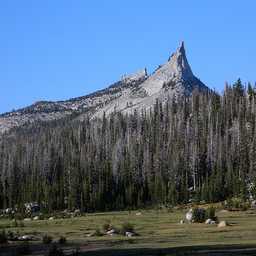

Index: 176
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testA/2013-08-20 01:06:51.jpg


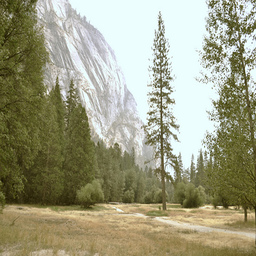

Index: 74
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testA/2015-08-31 14:57:21.jpg


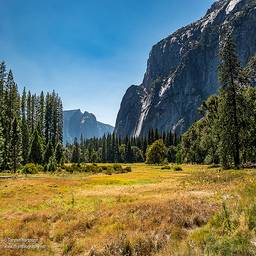

In [329]:
img_list = [] # each element is a dictionary

# pick 3 images from both A and B set
style_num = 3

testA_set = dataset_single(root, 'test', 'A', model.first_stage_model, flip=False)

A_list = [108, 131, 209, 176, 74]
for i in A_list[-3:]:
# for i in range(style_num):
#     img = testA_set[random.randint(0, testA_set.size-1)]
    img = testA_set[i]
    show_image(img['image'])
    img_list.append(img)

Index: 45
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testB/2013-02-20 08:05:00.jpg


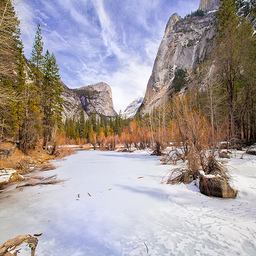

Index: 234
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testB/2010-10-13 23:08:10.jpg


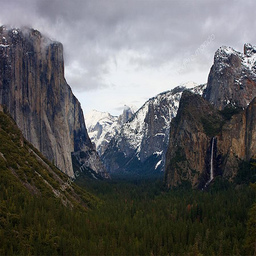

Index: 160
Image Path: /eva_data_2/vqi2i/datasets/summer2winter_yosemite/testB/2016-03-04 16:21:31.jpg


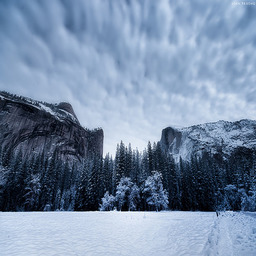

6

In [330]:
testB_set = dataset_single(root, 'test', 'B', model.first_stage_model, flip=False)

B_list = [ 12, 152, 166, 140, 64, 205, 115, 22, 194, 116, 28, 214 , 193, 170, 117, 204, 45, 234, 160]
for i in B_list[-3:]:
# for i in range(style_num):
#     img = testB_set[random.randint(0, testB_set.size-1)]
    img = testB_set[i]
    show_image(img['image'])
    img_list.append(img)    

len(img_list)

In [331]:
B_content = img_list[-1]

# get content z_code
z_code, z_indices, _ = model.encode_to_z(B_content['image'], B_content['label']) # [1, 256]
print(z_code.shape)
z_code_shape = (1, codebook_size,  h, w)
z_indices_shape = z_indices.shape

torch.Size([1, 512, 16, 16])


Reconstruction


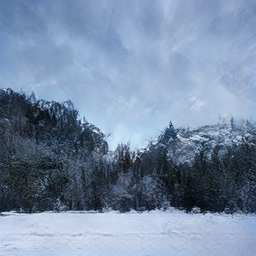

tensor(0.1336, device='cuda:0')
---------------------------------


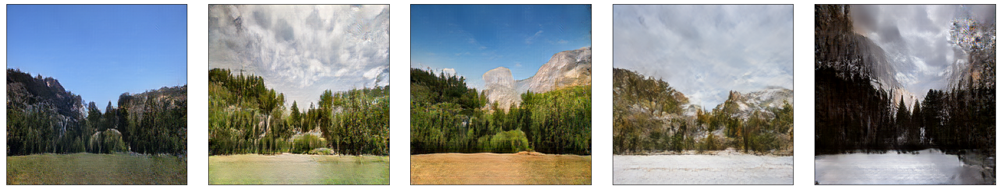

In [332]:
print('Reconstruction')
x_sample = model.decode_to_img(
    z_indices.reshape(z_code_shape[0], original_size, original_size), 
    (z_code_shape[0], codebook_size, original_size, original_size),  B_content['style'],  B_content['label'])
show_image(x_sample)
print(nn.L1Loss()(B_content['image'], x_sample))
print('---------------------------------')

new_style_imgs = []
f = plt.figure(figsize=(24, 10))
for i in range(0, len(img_list)-1):
    x_sample = model.decode_to_img(
        z_indices.reshape(z_code_shape[0], original_size, original_size), 
        (z_code_shape[0], codebook_size, original_size, original_size), img_list[i]['style'], img_list[i]['label'])
    ax = f.add_subplot(1, len(img_list)-1, i+1)
    fig = plt.imshow(tensor2im(x_sample))
    plt.tight_layout()
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)

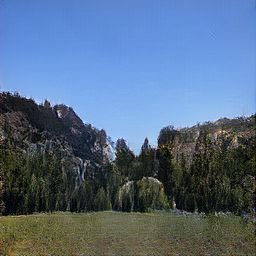

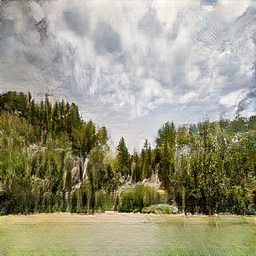

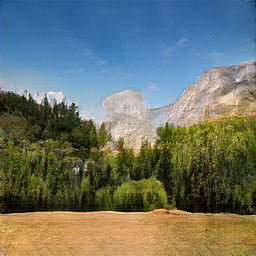

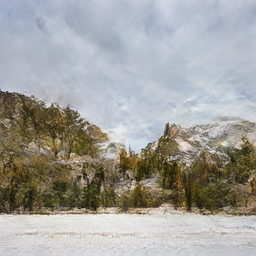

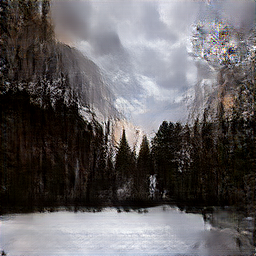

In [333]:

for i in range(0, len(img_list)-1):
    x_sample = model.decode_to_img(
        z_indices.reshape(z_code_shape[0], original_size, original_size), 
        (z_code_shape[0], codebook_size, original_size, original_size), img_list[i]['style'], img_list[i]['label'])
    show_image(x_sample)

(1, 512, 20, 28)
Time: 7.772407054901123 seconds


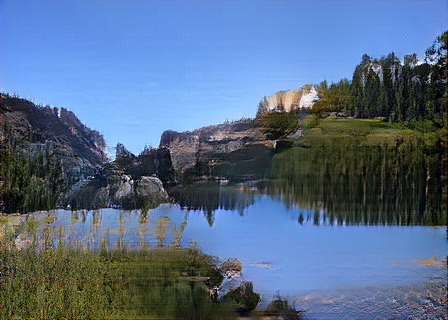

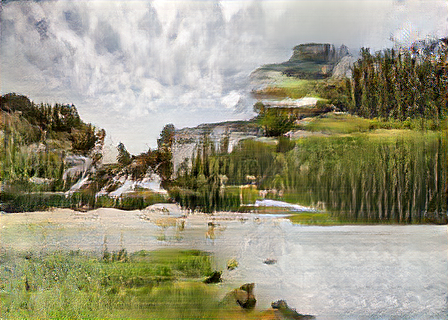

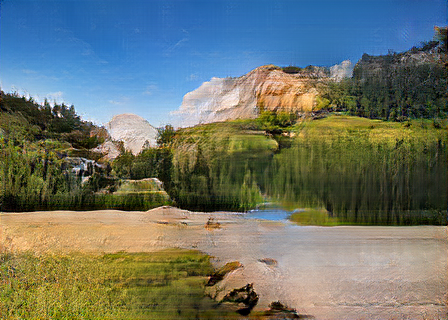

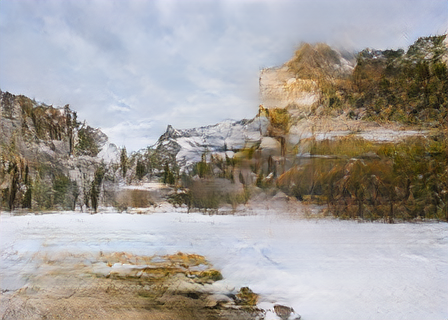

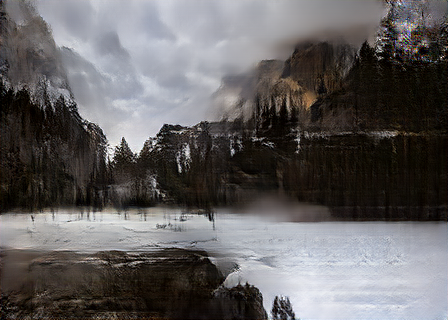

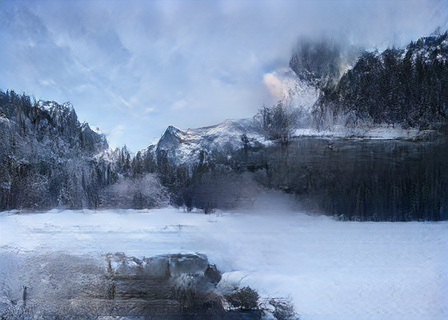

torch.Size([1, 3, 320, 448])


In [336]:
z_random = torch.randint(codebook_size, (w*h,)).to(device) # [400]
z_random = z_random.reshape(z_code_shape[0], h, w) # [1, 20, 20]

# set left-top part as the input image
z_random[:, :original_size, :original_size] = z_indices.reshape(z_code_shape[0], original_size, original_size)

## idx as the input (original + random)
idx = z_random.detach().clone() # [1, 20, 20]

# coordinate encode as condition
c_size = 256 # original image size
coordinate = np.arange(c_size*c_size).reshape(c_size,c_size,1)/(c_size*c_size)
coordinate = torch.from_numpy(coordinate) # [256, 256, 1]
c = model.get_c(coordinate) # [1, 1, 256, 256]
c = c.to(device)

# encode with condition
_, cidx = model.encode_to_c(c) # [1, 256]
cidx = cidx.reshape(z_code_shape[0], 16, 16) # [1, 16, 16]

gen_idx = sythesize(idx, _, label=B_content['label'], z_code_shape=z_code_shape, return_idx=True, temperature=1.1, top_k=80)

for img in img_list:
    gen_img = model.decode_to_img(gen_idx, (1, codebook_size, h, w), img['style'], img['label'])
    show_image(gen_img)
print(gen_img.shape)

In [337]:
print(gen_idx)
torch.save(gen_idx, 'trans_ext_example2.pt')

tensor([[[374,  94, 409, 180, 382, 190, 289,  95, 493, 212, 285, 326, 382,  95,
          285, 212, 326, 285, 326, 326, 326, 326, 326, 326, 326, 326, 326, 326],
         [382, 409,  94, 493,  78, 217, 180, 493, 212, 283, 289, 382, 289,  94,
          180, 382, 217, 493, 493, 493, 326, 326, 326, 326, 326, 493, 289, 289],
         [374, 493, 480, 289, 289, 374, 283, 217, 285, 374, 371, 285, 374, 382,
          180, 190, 326, 326, 326, 326, 326, 326, 374, 285, 374, 285,  90,  95],
         [493,  95, 326, 382, 212, 285, 353,  94, 493, 180, 285, 217, 289, 285,
          493, 289, 289, 493, 480, 283,  78, 382, 371,  90,  94, 371, 371, 371],
         [493, 217, 374, 382, 493, 180, 289, 180, 493, 382, 374, 217, 409, 180,
          382, 289,  95, 409, 283,  94,  95, 289, 283,  94, 283, 283, 283, 283],
         [285, 285, 289, 289, 374, 493, 180, 190,  95, 285, 353,  95, 289, 289,
          382, 180, 121, 150, 150,  95, 119,  95, 283, 283, 283, 283, 283, 283],
         [ 78, 283, 289, 174, 180,